In [1]:
import warnings
warnings.filterwarnings('ignore')

from IPython.display import display

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import pingouin as pg

import glob
import os
import shutil

pd.options.display.max_info_rows = 30000000
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 100)

sns.set_theme(style='darkgrid')

# Tamaño figuras
plt.rcParams["figure.figsize"] = (20,8)
plt.rcParams["figure.dpi"] = 600

pd.options.mode.chained_assignment = None

# Paleta de colores
color = ['#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#b13c47']

color2 = ['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#b13c47']

# New 9 colors. '#264653' for the first. Blue for the last. Between red and yellow for the middle.
color3 = ['#264653', '#e9c46a', '#f4a261', '#f77f6c', '#e76f51', '#d75c50', '#c34c45', '#b13c47', '#2a9d8f']

# 11 colors. Add two news after the first.
color4 = ['#264653', '#365663', '#668693', '#e9c46a', '#f4a261', '#f77f6c', '#e76f51', '#d75c50', '#c34c45', '#b13c47', '#2a9d8f']


color5 = ['#264653', '#e9c46a',  '#b13c47', '#2a9d8f']

color6 = ['#264653', '#365663', '#668693', '#e9c46a', '#b13c47', '#2a9d8f']


In [2]:
# Join all of csv files of the folder ../resultados, mantaining the header of the first file
#path = r'../results/Resultados_definitivos/' # use your path
#all_files = glob.glob(os.path.join(path, "*.csv"))

#df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
#df = pd.concat(df_from_each_file, ignore_index=True)

# Read df from csv
df = pd.read_csv('../results/resultados-definitivos-paper.csv', sep=',')

df['algorithm'] = df['algorithm'].replace('fges', 'Fges')
df['algorithm'] = df['algorithm'].replace('fges-faithfulness', 'Fges-faithfulness')
df['algorithm'] = df['algorithm'].replace('ges-tetrad', 'Fges-ges')
df['algorithm'] = df['algorithm'].replace('ges', 'GES')
df['algorithm'] = df['algorithm'].replace('ges-noParallel', 'GES-np')
df['algorithm'] = df['algorithm'].replace('ges parallel', 'GES')
df['algorithm'] = df['algorithm'].replace('pges', 'pGES')
df['algorithm'] = df['algorithm'].replace('pges-jc', 'pGES-jc')
df['algorithm'] = df['algorithm'].replace('pges-noParallel', 'pGES-np')
df['algorithm'] = df['algorithm'].replace('pges-jc-noParallel', 'pGES-jc-np')

df.head()

,algorithm,network,bbdd,threads,pges_threads,interleaving,seed,SHD,loglike,bdeu,deltaMM,deltaMM+,deltaMM-,iterations,time(s)
0,Fges,alarm,alarm.xbif50001246_,16,0,0,-1,7,-0.281438,-54069.673911,14.0,0.0,14.0,1,0.770
1,Fges,alarm,alarm.xbif50001246_,16,-1,-1,2,7,-0.281438,-54069.673911,14.0,0.0,14.0,1,0.786
2,Fges,alarm,alarm.xbif50001246_,1,0,0,-1,7,-0.281438,-54069.673911,14.0,0.0,14.0,1,0.807
3,Fges,alarm,alarm.xbif50001246_,1,-1,-1,2,7,-0.281438,-54069.673911,14.0,0.0,14.0,1,0.784
4,Fges,alarm,alarm.xbif50001246_,2,0,0,-1,7,-0.281438,-54069.673911,14.0,0.0,14.0,1,1.046


In [3]:
# Remove GES-np with pges_threads == 0
df = df[~((df['algorithm'] == 'GES-np') & (df['pges_threads'] == 0))]

# Remove Fges with pges_threads == 0
df = df[~((df['algorithm'] == 'Fges') & (df['pges_threads'] == 0))]

# Changue pges_threads == -1 to 1
df['pges_threads'] = df['pges_threads'].replace(-1, 1)

In [4]:
# Remove Fges-faithfulness with pges_threads == 0
df = df[~((df['algorithm'] == 'Fges-faithfulness') & (df['pges_threads'] == 0))]

df = df[~((df['algorithm'] == 'Fges-faithfulness') & (df['pges_threads'] == 0))]

# Replace pges_threads threads in Fges, Fges-faithfulness, GES to 1
df.loc[df['algorithm'] == 'Fges', 'pges_threads'] = 1
df.loc[df['algorithm'] == 'Fges-faithfulness', 'pges_threads'] = 1
df.loc[df['algorithm'] == 'Fges-ges', 'pges_threads'] = 1
df.loc[df['algorithm'] == 'GES', 'pges_threads'] = 1
df.loc[df['algorithm'] == 'ges-noParallel', 'pges_threads'] = 1
df.loc[df['algorithm'] == 'ges-tetrad', 'pges_threads'] = 1

# Changue interleaving of Fges to -3 and Fges-faithfulness to -2
df.loc[df['algorithm'] == 'Fges-faithfulness', 'interleaving'] = -2
df.loc[df['algorithm'] == 'Fges', 'interleaving'] = -3

# Remove Fges-ges
df = df[df['algorithm'] != 'Fges-ges']

In [5]:
# Remove pGES-jc with seed = -1
df = df[~((df['algorithm'] == 'pGES-jc') & (df['seed'] == -1))]

# Remove Fges-ges with seed = -1
df = df[~((df['algorithm'] == 'Fges-ges') & (df['seed'] == -1))]

# Changue seed to 2
df['seed'] = df['seed'].replace(-1, 2)

# Remove earthquake database
df = df[df['network'] != 'earthquake']

In [6]:
# Borramos pGES-jc-np y pGES-np
df = df[~((df['algorithm'] == 'pGES-jc-np') | (df['algorithm'] == 'pGES-np'))]

In [7]:
# Create a copy of df
df3 = df.copy()

### Cargamos los datos del circular

In [8]:
df2 = pd.read_csv('../results/resultados-circular-galgo-interleaving.csv', sep=',')

# Only keep the maximun interleaving (2147483647)
df2 = df2[(df2['interleaving'] == 2147483647)]

df2.head()

,algorithm,network,bbdd,threads,pges_threads,interleaving,seed,SHD,loglike,bdeu,deltaMM,deltaMM+,deltaMM-,iterations,time(s)
7,circular_ges_c2,alarm,alarm.xbif50001246_,8,2,2147483647,2,10,-0.387282,-54175.022659,20.0,6.0,14.0,4,1.388
25,circular_ges_c2,alarm,alarm.xbif50001246_,8,4,2147483647,2,14,-0.387739,-54306.114446,28.0,10.0,18.0,6,1.676
43,circular_ges_c2,alarm,alarm.xbif50001246_,8,6,2147483647,2,17,-0.318916,-54494.287067,42.0,24.0,18.0,14,2.844
61,circular_ges_c2,alarm,alarm.xbif50001246_,8,8,2147483647,2,17,-0.336205,-54413.149624,40.0,22.0,18.0,9,2.164
79,circular_ges_c2,alarm,alarm.xbif50001_,8,2,2147483647,2,10,-0.367919,-53655.956310,20.0,6.0,14.0,3,1.172


### Cargamos los datos con alpha

In [9]:
# Join all of csv files of the folder ../resultados, mantaining the header of the first file
path = r'../results/Resultados_circular_galgo_alpha/' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))

df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df4 = pd.concat(df_from_each_file, ignore_index=True)

In [10]:
# Join all of csv files of the folder ../resultados, mantaining the header of the first file
path = r'../results/Resultados_circular_galgo_alpha_corregido/' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))

df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df5 = pd.concat(df_from_each_file, ignore_index=True)

# Append df5 to df4
df4 = df4.append(df5, ignore_index=True)

# Append qsrt symbol to all interleaving values
df4['interleaving'] = df4['interleaving'].astype(str) + '√N'

In [11]:
# Print df2 algorithms unique
df2['algorithm'].unique()

array(['circular_ges_c2'], dtype=object)

In [12]:
# Print df4 algorithms unique
df4['algorithm'].unique()

array(['circular_ges_c2'], dtype=object)

In [13]:
# Join df and df2
df = pd.concat([df3, df2], ignore_index=True)
df = pd.concat([df, df4], ignore_index=True)

# Changue interleaving 2147483647 to infinity symbol
df['interleaving'] = df['interleaving'].replace(2147483647, '∞')

In [14]:
# Delete earthquake
df = df[df['network'] != 'earthquake']

In [15]:
df['bdeu'] = df['bdeu'] / 5000

In [16]:
# Remove algorithms with pges_threads == 16
df = df[df['pges_threads'] != 16]

In [17]:
df_original = df.copy()
df = df[df['threads'] == 8]

# Tablas de datos

In [18]:
df_unstack = df.drop(["bbdd", "seed", "SHD", 'threads', "loglike", "bdeu", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "pges_threads", "interleaving"], observed=True).mean().unstack(0)

time(s)                        \
network                                         alarm      andes     barley   
algorithm         pges_threads interleaving                                   
Fges              1            -3            0.965727   2.971727   4.732455   
Fges-faithfulness 1            -2            1.247000  11.185909  13.225545   
GES               1            -1            0.895455  23.378000   2.020364   
GES-np            1            -1            1.092909  58.342727   5.422455   
circular_ges_c2   2            1.0√N         1.098364  13.361364   3.328455   
                               1.5√N         1.077545  13.871455   3.485909   
                               1.75√N        1.089000  13.109818   3.616818   
                               1.85√N        1.131818  14.667000   3.478091   
                               1.8√N         1.100545  13.373545   3.448000   
                               1.9√N         1.115727  13.649273   3.377818   
                               10.0√N        1.024455  13.391545   2.295545   
                               2.0√N         1.098364  13.458636   3.270182   
                               4.0√N         1.024727  13.119727   3.249909   
                               5.0√N         1.021909  14.088091   3.581000   
                               6.0√N         1.039909  13.160727   3.425818   
                               7.0√N         1.042182  12.972909   3.454000   
                               8.0√N         1.037364  13.192909   3.237818   
                               9.0√N         1.050545  13.391273   3.390636   
                               ∞             1.260455  14.617000   2.613909   
                  4            1.0√N         1.406909  11.518818   3.407091   
                               1.5√N         1.513000  11.990545   3.291000   
                               1.75√N        1.451909  12.081545   3.428727   
                               1.85√N        1.339455  12.363636   3.330545   
                               1.8√N         1.411818  11.804182   3.364909   
                               1.9√N         1.426455  12.431455   3.420091   
                               10.0√N        1.250455  11.820182   3.943636   
                               2.0√N         1.420091  12.842273   3.432636   
                               4.0√N         1.323636  12.506545   5.324091   
                               5.0√N         1.400364  11.820182   2.626455   
                               6.0√N         1.370545  11.114091   4.186091   
                               7.0√N         1.322636  11.649273   3.387727   
                               8.0√N         1.269273  11.959455   4.195909   
                               9.0√N         1.246727  11.663182   3.374636   
                               ∞             1.591818  13.541000   2.634182   
                  6            1.0√N         1.750455  12.312636   3.382727   
                               1.5√N         1.738636  12.220545   3.507727   
                               1.75√N        1.764000  12.382364   3.463091   
                               1.85√N        1.791909  12.999455   3.576455   
                               1.8√N         1.828091  12.544545   3.487000   
                               1.9√N         1.688091  12.557182   3.437364   
                               10.0√N        1.553545  12.482727   4.099000   
                               2.0√N         1.805364  12.973727   3.425182   
                               4.0√N         1.424000  14.863818   3.543636   
                               5.0√N         1.364273  13.486545   5.368182   
                               6.0√N         1.456818  12.999091   5.370182   
                               7.0√N         1.480909  13.434727   4.399455   
                               8.0√N         1.489273  12.775909   3.794636   
                               9.0√N         1.520364  13.448636   4.049727   
                 

In [19]:
df_unstack = df.drop(["bbdd", "seed",  "bdeu", "threads", "loglike", "time(s)", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "pges_threads", "interleaving"], observed=True).mean().unstack(0)

SHD                         \
network                                          alarm       andes     barley   
algorithm         pges_threads interleaving                                     
Fges              1            -3             7.909091  232.454545  59.545455   
Fges-faithfulness 1            -2             7.909091  179.272727  55.909091   
GES               1            -1             9.272727  151.545455  61.181818   
GES-np            1            -1             9.272727  151.545455  61.181818   
circular_ges_c2   2            1.0√N          7.909091  155.818182  62.909091   
                               1.5√N          7.909091  159.272727  60.272727   
                               1.75√N         8.000000  157.181818  58.909091   
                               1.85√N         8.636364  159.000000  57.818182   
                               1.8√N          8.272727  158.272727  58.090909   
                               1.9√N          8.636364  157.363636  57.818182   
                               10.0√N         9.363636  167.818182  57.000000   
                               2.0√N          9.545455  157.363636  57.090909   
                               4.0√N          7.909091  155.818182  62.909091   
                               5.0√N          7.636364  158.272727  59.454545   
                               6.0√N          7.909091  159.272727  60.272727   
                               7.0√N          8.000000  157.181818  58.909091   
                               8.0√N          9.545455  157.363636  57.090909   
                               9.0√N          9.090909  161.909091  57.545455   
                               ∞              9.181818  180.090909  55.818182   
                  4            1.0√N         11.000000  168.727273  59.636364   
                               1.5√N         10.363636  170.272727  62.000000   
                               1.75√N        10.363636  170.090909  62.000000   
                               1.85√N        10.363636  170.090909  62.000000   
                               1.8√N         10.363636  170.818182  62.000000   
                               1.9√N         10.363636  170.454545  62.000000   
                               10.0√N         9.727273  164.181818  57.454545   
                               2.0√N         10.363636  170.000000  62.000000   
                               4.0√N          9.090909  163.272727  57.545455   
                               5.0√N          8.727273  162.818182  59.272727   
                               6.0√N          8.090909  162.909091  58.363636   
                               7.0√N          8.636364  163.000000  57.636364   
                               8.0√N          8.181818  160.181818  58.545455   
                               9.0√N          8.909091  163.727273  57.545455   
                               ∞             12.363636  170.000000  63.090909   
                  6            1.0√N         11.545455  170.636364  58.000000   
                               1.5√N         11.545455  171.545455  58.000000   
                               1.75√N        11.545455  171.545455  58.000000   
                               1.85√N        11.545455  171.545455  58.000000   
                               1.8√N         11.545455  171.545455  58.000000   
                               1.9√N         11.545455  171.545455  58.000000   
                               10.0√N        11.636364  162.909091  58.363636   
                               2.0√N         11.545455  171.545455  58.000000   
                               4.0√N         12.363636  163.909091  59.090909   
                               5.0√N         13.181818  166.090909  60.818182   
                               6.0√N         10.090909  161.272727  60.363636   
                               7.0√N         12.000000  163.545455  60.000000   
                               8.0√N         12.818182  166.272727  58.818182   
 

In [20]:
df_unstack = df.drop(["bbdd", "seed", "SHD", "loglike", "threads", "time(s)", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "pges_threads", "interleaving"], observed=True).mean().unstack(0)

bdeu                        \
network                                          alarm      andes     barley   
algorithm         pges_threads interleaving                                    
Fges              1            -3           -10.788383 -94.740114 -53.357547   
Fges-faithfulness 1            -2           -10.788383 -94.523032 -52.838533   
GES               1            -1           -10.873071 -94.316279 -53.223129   
GES-np            1            -1           -10.873071 -94.316279 -53.223129   
circular_ges_c2   2            1.0√N        -10.790948 -94.360028 -52.995270   
                               1.5√N        -10.790236 -94.360195 -53.029636   
                               1.75√N       -10.787820 -94.358496 -52.955702   
                               1.85√N       -10.788593 -94.358292 -52.826612   
                               1.8√N        -10.787880 -94.353257 -52.863385   
                               1.9√N        -10.788593 -94.361037 -52.826612   
                               10.0√N       -10.800050 -94.399160 -53.045635   
                               2.0√N        -10.790073 -94.354021 -52.821411   
                               4.0√N        -10.790948 -94.360028 -52.995270   
                               5.0√N        -10.788554 -94.367263 -52.673318   
                               6.0√N        -10.790236 -94.360195 -53.029636   
                               7.0√N        -10.787820 -94.358283 -52.955702   
                               8.0√N        -10.790073 -94.354021 -52.821411   
                               9.0√N        -10.795396 -94.380028 -52.804475   
                               ∞            -10.798795 -94.460447 -52.758200   
                  4            1.0√N        -10.805879 -94.395131 -52.849919   
                               1.5√N        -10.803045 -94.433102 -53.325815   
                               1.75√N       -10.803045 -94.428339 -53.325815   
                               1.85√N       -10.803045 -94.431902 -53.325815   
                               1.8√N        -10.803045 -94.432802 -53.325815   
                               1.9√N        -10.803045 -94.432013 -53.325815   
                               10.0√N       -10.796807 -94.378109 -52.819600   
                               2.0√N        -10.803045 -94.430843 -53.325815   
                               4.0√N        -10.799747 -94.378991 -52.660466   
                               5.0√N        -10.790448 -94.378976 -53.029423   
                               6.0√N        -10.786605 -94.376817 -52.877842   
                               7.0√N        -10.793568 -94.383620 -52.928901   
                               8.0√N        -10.788210 -94.366547 -52.838324   
                               9.0√N        -10.791292 -94.385351 -52.850870   
                               ∞            -10.809454 -94.406020 -53.059057   
                  6            1.0√N        -10.815955 -94.426097 -52.856913   
                               1.5√N        -10.815955 -94.428541 -52.856913   
                               1.75√N       -10.815955 -94.428541 -52.856913   
                               1.85√N       -10.815955 -94.428541 -52.856913   
                               1.8√N        -10.815955 -94.428541 -52.856913   
                               1.9√N        -10.815955 -94.428541 -52.856913   
                               10.0√N       -10.819391 -94.381137 -52.777393   
                               2.0√N        -10.815955 -94.428541 -52.856913   
                               4.0√N        -10.828490 -94.391372 -52.896316   
                               5.0√N        -10.981863 -94.393362 -52.870080   
                               6.0√N        -10.805922 -94.366056 -52.680171   
                               7.0√N        -10.826879 -94.386698 -53.006081   
                               8.0√N        -10.838737 -94.399868 -52.805648   
                               9.0√N        -10.81

In [21]:
df_unstack = df.drop(["bbdd", "seed", "SHD", "loglike", "threads", "bdeu", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)
df_unstack.groupby(["network", "algorithm", "pges_threads" , "interleaving"], observed=True).count().unstack(0)

time(s)                     \
network                                       alarm andes barley child   
algorithm         pges_threads interleaving                              
Fges              1            -3              11.0  11.0   11.0  11.0   
Fges-faithfulness 1            -2              11.0  11.0   11.0  11.0   
GES               1            -1              11.0  11.0   11.0  11.0   
GES-np            1            -1              11.0  11.0   11.0  11.0   
circular_ges_c2   2            1.0√N           11.0  11.0   11.0  11.0   
                               1.5√N           11.0  11.0   11.0  11.0   
                               1.75√N          11.0  11.0   11.0  11.0   
                               1.85√N          11.0  11.0   11.0  11.0   
                               1.8√N           11.0  11.0   11.0  11.0   
                               1.9√N           11.0  11.0   11.0  11.0   
                               10.0√N          11.0  11.0   11.0  11.0   
                               2.0√N           11.0  11.0   11.0  11.0   
                               4.0√N           11.0  11.0   11.0  11.0   
                               5.0√N           11.0  11.0   11.0  11.0   
                               6.0√N           11.0  11.0   11.0  11.0   
                               7.0√N           11.0  11.0   11.0  11.0   
                               8.0√N           11.0  11.0   11.0  11.0   
                               9.0√N           11.0  11.0   11.0  11.0   
                               ∞               11.0  11.0   11.0  11.0   
                  4            1.0√N           11.0  11.0   11.0  11.0   
                               1.5√N           11.0  11.0   11.0  11.0   
                               1.75√N          11.0  11.0   11.0  11.0   
                               1.85√N          11.0  11.0   11.0  11.0   
                               1.8√N           11.0  11.0   11.0  11.0   
                               1.9√N           11.0  11.0   11.0  11.0   
                               10.0√N          11.0  11.0   11.0  11.0   
                               2.0√N           11.0  11.0   11.0  11.0   
                               4.0√N           11.0  11.0   11.0  11.0   
                               5.0√N           11.0  11.0   11.0  11.0   
                               6.0√N           11.0  11.0   11.0  11.0   
                               7.0√N           11.0  11.0   11.0  11.0   
                               8.0√N           11.0  11.0   11.0  11.0   
                               9.0√N           11.0  11.0   11.0  11.0   
                               ∞               11.0  11.0   11.0  11.0   
                  6            1.0√N           11.0  11.0   11.0  11.0   
                               1.5√N           11.0  11.0   11.0  11.0   
                               1.75√N          11.0  11.0   11.0  11.0   
                               1.85√N          11.0  11.0   11.0  11.0   
                               1.8√N           11.0  11.0   11.0  11.0   
                               1.9√N           11.0  11.0   11.0  11.0   
                               10.0√N          11.0  11.0   11.0  11.0   
                               2.0√N           11.0  11.0   11.0  11.0   
                               4.0√N           11.0  11.0   11.0  11.0   
                               5.0√N           11.0  11.0   11.0  11.0   
                               6.0√N           11.0  11.0   11.0  11.0   
                               7.0√N           11.0  11.0   11.0  11.0   
                               8.0√N           11.0  11.0   11.0  11.0   
                               9.0√N           11.0  11.0   11.0  11.0   
                               ∞               11.0  11.0   11.0  11.0   
                  8            1.0√N           11.0  11.0   11.0  11.0   
                               1.5√N           11.0  11.0   11.0  11.0   
                               1.75√N          1

# Media por interleaving

In [22]:
df_unstack = df.drop(["bbdd", "seed", "SHD", "loglike", "threads", "bdeu", "deltaMM", "deltaMM+", "deltaMM-", "iterations", "pges_threads"], axis=1)
df_unstack.groupby(["network", "algorithm", "interleaving"], observed=True).mean().unstack(0)

time(s)                                  \
network                            alarm      andes     barley     child   
algorithm         interleaving                                             
Fges              -3            0.965727   2.971727   4.732455  5.228364   
Fges-faithfulness -2            1.247000  11.185909  13.225545  6.442273   
GES               -1            0.895455  23.378000   2.020364  0.364364   
GES-np            -1            1.092909  58.342727   5.422455  0.346909   
circular_ges_c2   1.0√N         1.551273  12.951432   3.643091  0.878864   
                  1.5√N         1.563182  13.152273   3.674909  0.900886   
                  1.75√N        1.555955  13.005727   3.749227  0.932682   
                  1.85√N        1.507023  13.530023   3.780068  0.952341   
                  1.8√N         1.565568  13.036455   3.668455  0.889273   
                  1.9√N         1.524159  13.245864   3.754045  0.912068   
                  10.0√N        1.365273  13.190182   3.798114  0.861455   
                  2.0√N         1.570273  13.402614   3.667386  0.885977   
                  4.0√N         1.391136  14.447295   4.616136  0.862045   
                  5.0√N         1.339364  13.932955   4.108205  0.812250   
                  6.0√N         1.370250  13.274455   4.569409  0.844023   
                  7.0√N         1.363136  13.322818   4.304864  0.888364   
                  8.0√N         1.379818  13.373182   3.947545  0.909682   
                  9.0√N         1.353023  13.271159   3.801614  0.882909   
                  ∞             1.694409  13.875750   3.447409  1.039136   
pGES              ∞             1.059424   6.924152   2.093152  0.775636   
pGES-jc           ∞             1.249091   8.349515   2.616909  0.751909   

                                                                             \
network                           diabetes   hailfinder    hepar2 insurance   
algorithm         interleaving                                                
Fges              -3            205.939909  1667.880636  0.812182  0.742182   
Fges-faithfulness -2            779.395273  1776.449545  1.850909  0.928455   
GES               -1            220.060273     1.199455  1.332636  0.599091   
GES-np            -1            892.267818     1.615182  2.298000  0.661727   
circular_ges_c2   1.0√N         238.412841     2.215432  2.332955  1.585432   
                  1.5√N         233.115636     2.142250  2.290318  1.609909   
                  1.75√N        227.957909     2.212932  2.344955  1.585614   
                  1.85√N        227.874727     2.199682  2.402091  1.573705   
                  1.8√N         230.416523     2.243023  2.320568  1.560727   
                  1.9√N         225.932386     2.273523  2.354114  1.576295   
                  10.0√N        226.610455     2.247182  2.321409  1.444977   
                  2.0√N         224.130409     2.280614  2.300955  1.578705   
                  4.0√N         259.582773     2.278295  2.373977  1.394818   
                  5.0√N         247.300023     2.080682  2.266682  1.372477   
                  6.0√N         242.153318     2.472023  2.284636  1.335955   
                  7.0√N         238.635750     2.229295  2.266068  1.409727   
                  8.0√N         229.906591     2.184364  2.542409  1.425318   
                  9.0√N         230.732205     2.216636  2.381068  1.426045   
                  ∞             296.967864     2.462386  2.480409  1.495432   
pGES              ∞             113.863788     1.212121  1.331030  0.905061   
pGES-jc           ∞             168.993121     1.518061  1.650121  0.957485   

                                                                     \
network                                link    mildew         munin   
algorithm         interleaving                                        
Fges              -3              41.115909       NaN  12331.305636   
Fges-faithfulness -2       

In [23]:
df_unstack = df.drop(["bbdd", "seed",  "bdeu", "loglike", "time(s)", "threads",  "deltaMM", "deltaMM+", "deltaMM-", "iterations", "pges_threads"], axis=1)
df_unstack.groupby(["network", "algorithm", "interleaving"], observed=True).mean().unstack(0)

SHD                                   \
network                             alarm       andes     barley     child   
algorithm         interleaving                                               
Fges              -3             7.909091  232.454545  59.545455  5.363636   
Fges-faithfulness -2             7.909091  179.272727  55.909091  4.454545   
GES               -1             9.272727  151.545455  61.181818  8.272727   
GES-np            -1             9.272727  151.545455  61.181818  8.272727   
circular_ges_c2   1.0√N         10.750000  166.386364  60.272727  4.863636   
                  1.5√N         10.590909  167.863636  60.204545  5.931818   
                  1.75√N        10.613636  167.295455  59.863636  4.386364   
                  1.85√N        10.772727  167.750000  59.590909  4.363636   
                  1.8√N         10.681818  167.750000  59.659091  4.386364   
                  1.9√N         10.772727  167.431818  59.590909  4.363636   
                  10.0√N        10.727273  167.068182  58.659091  3.772727   
                  2.0√N         11.000000  167.318182  59.409091  4.545455   
                  4.0√N          9.863636  161.954545  61.931818  3.795455   
                  5.0√N          9.886364  163.909091  62.795455  7.227273   
                  6.0√N          9.500000  164.045455  61.363636  5.363636   
                  7.0√N         10.136364  164.045455  60.000000  2.954545   
                  8.0√N         10.500000  163.704545  58.931818  3.863636   
                  9.0√N         10.136364  165.886364  59.159091  3.363636   
                  ∞             11.431818  174.363636  60.386364  2.954545   
pGES              ∞              7.727273  152.393939  58.121212  1.303030   
pGES-jc           ∞              7.333333  151.545455  56.454545  2.545455   

                                                                             \
network                           diabetes hailfinder     hepar2  insurance   
algorithm         interleaving                                                
Fges              -3            380.272727  45.909091  92.181818  23.818182   
Fges-faithfulness -2            379.272727  43.909091  87.000000  22.818182   
GES               -1            263.000000  32.909091  76.545455  24.909091   
GES-np            -1            263.000000  32.909091  76.545455  24.909091   
circular_ges_c2   1.0√N         418.431818  37.863636  76.681818  27.750000   
                  1.5√N         408.840909  36.500000  76.727273  27.272727   
                  1.75√N        409.863636  36.386364  76.818182  27.181818   
                  1.85√N        407.454545  36.250000  76.954545  27.454545   
                  1.8√N         409.863636  36.409091  76.954545  27.454545   
                  1.9√N         406.318182  36.250000  76.977273  27.409091   
                  10.0√N        407.431818  36.409091  76.954545  28.613636   
                  2.0√N         411.454545  36.363636  77.068182  27.772727   
                  4.0√N         446.909091  39.272727  75.886364  26.954545   
                  5.0√N         436.340909  38.454545  76.272727  26.750000   
                  6.0√N         430.568182  37.500000  76.022727  27.454545   
                  7.0√N         425.590909  35.750000  76.522727  25.681818   
                  8.0√N         413.636364  35.659091  76.840909  26.409091   
                  9.0√N         409.590909  36.159091  76.750000  26.500000   
                  ∞             394.318182  35.590909  76.909091  24.863636   
pGES              ∞             268.515152  33.333333  75.666667  24.848485   
pGES-jc           ∞             266.303030  32.909091  75.909091  24.212121   

                                                                     \
network                                link     mildew        munin   
algorithm         interleaving                                        
Fges              -3            1370.454545        NaN 

In [24]:
df_unstack = df.drop(["bbdd", "seed", "SHD", "loglike", "time(s)", "threads",  "deltaMM", "deltaMM+", "deltaMM-", "iterations", "pges_threads"], axis=1)
df_unstack.groupby(["network", "algorithm", "interleaving"], observed=True).mean().unstack(0)

bdeu                                   \
network                             alarm      andes     barley      child   
algorithm         interleaving                                               
Fges              -3           -10.788383 -94.740114 -53.357547 -12.458725   
Fges-faithfulness -2           -10.788383 -94.523032 -52.838533 -12.454962   
GES               -1           -10.873071 -94.316279 -53.223129 -12.469196   
GES-np            -1           -10.873071 -94.316279 -53.223129 -12.469196   
circular_ges_c2   1.0√N        -10.809298 -94.398078 -52.881158 -12.520159   
                  1.5√N        -10.808412 -94.408223 -53.008723 -12.537825   
                  1.75√N       -10.807808 -94.406608 -52.990240 -12.518643   
                  1.85√N       -10.808001 -94.407447 -52.957967 -12.517759   
                  1.8√N        -10.807822 -94.406414 -52.967160 -12.518643   
                  1.9√N        -10.808001 -94.408162 -52.957967 -12.517759   
                  10.0√N       -10.809028 -94.394566 -52.982882 -12.481015   
                  2.0√N        -10.808371 -94.406115 -52.956667 -12.518714   
                  4.0√N        -10.809365 -94.382938 -53.029103 -12.476864   
                  5.0√N        -10.843061 -94.388864 -53.146017 -12.562652   
                  6.0√N        -10.838000 -94.382211 -53.088869 -12.510309   
                  7.0√N        -10.844376 -94.391666 -53.081657 -12.451712   
                  8.0√N        -10.810865 -94.386262 -52.837980 -12.482763   
                  9.0√N        -10.802301 -94.398984 -52.935605 -12.478341   
                  ∞            -10.808582 -94.436051 -52.928449 -12.445772   
pGES              ∞            -10.788183 -94.316195 -52.892462 -12.427043   
pGES-jc           ∞            -10.788554 -94.315231 -52.813616 -12.436880   

                                                                             \
network                           diabetes hailfinder     hepar2  insurance   
algorithm         interleaving                                                
Fges              -3           -277.629849 -50.456310 -33.000432 -13.558246   
Fges-faithfulness -2           -272.192190 -50.418335 -32.993694 -13.552390   
GES               -1           -226.328180 -50.413431 -32.962535 -13.562299   
GES-np            -1           -226.328180 -50.413431 -32.962535 -13.562299   
circular_ges_c2   1.0√N        -250.255873 -50.456653 -32.964166 -13.616088   
                  1.5√N        -249.980772 -50.447601 -32.964280 -13.625782   
                  1.75√N       -250.453465 -50.451975 -32.964510 -13.616579   
                  1.85√N       -249.747187 -50.449986 -32.964807 -13.617605   
                  1.8√N        -250.137179 -50.451177 -32.964597 -13.617605   
                  1.9√N        -249.637745 -50.449986 -32.964814 -13.617408   
                  10.0√N       -248.824987 -50.447218 -32.964784 -13.635986   
                  2.0√N        -250.169778 -50.447857 -32.964803 -13.618260   
                  4.0√N        -253.676931 -50.457659 -32.961603 -13.585093   
                  5.0√N        -252.734516 -50.452337 -32.962623 -13.578097   
                  6.0√N        -252.113719 -50.445058 -32.962713 -13.623819   
                  7.0√N        -251.940284 -50.449785 -32.963646 -13.589731   
                  8.0√N        -249.398959 -50.446775 -32.964008 -13.593856   
                  9.0√N        -250.783156 -50.451244 -32.964163 -13.598751   
                  ∞            -249.408985 -50.450578 -32.966662 -13.565610   
pGES              ∞            -227.806022 -50.415388 -32.960804 -13.557254   
pGES-jc           ∞            -228.153292 -50.413431 -32.960780 -13.559289   

                                                                              \
network                               link     mildew       munin pathfinder   
algorithm         interleaving                                                 
Fges              -3       

In [25]:
# Para estos experimentos, eliminamos GES-np, pGES-np y pGES-jc-np, porque ya hemos visto en las tablas cómo funcionan
df = df[~df['algorithm'].isin(['pGES-np', 'pGES-jc-np', 'GES-np'])]

In [26]:
df_original = df.copy()

# Order of bars: '1.0√N', '1.5√N', '1.75√N', '1.8√N', '1.85√N', '1.9√N', '2√N', '∞'
df['interleaving'] = df['interleaving'].astype('category')
#df['interleaving'].cat.set_categories([-1, '1.0√N', '1.5√N', '1.75√N', '1.8√N', '1.85√N', '1.9√N', '2.0√N', '∞'], inplace=True)
df['interleaving'].cat.set_categories([-1, '1.0√N', '1.5√N', '1.75√N', '1.8√N', '1.85√N', '1.9√N', '2.0√N', '4.0√N', '5.0√N', '6.0√N', '7.0√N', '8.0√N', '9.0√N', '10.0√N', '∞'], inplace=True)

# Add the number of nodes of each network
df['nodes'] = df['network'].map({'alarm': 37, 'barley' : 48, 'child': 20, 'insurance': 27, 'mildew': 35, 'water': 32, 'hailfinder' : 56, 'hepar2' : 70, 'win95pts' : 76, 'andes' : 223, 'diabetes' : 413, 'link' : 724, 'pathfinder' : 109, 'pigs' : 441, 'munin' : 1041})

# Order by nodes
df = df.sort_values(by=['nodes'])

In [27]:
df

,algorithm,network,bbdd,threads,pges_threads,interleaving,seed,SHD,loglike,bdeu,deltaMM,deltaMM+,deltaMM-,iterations,time(s),nodes
13533,circular_ges_c2,child,child.xbif50007_,8,2,1.5√N,2,11,-0.802101,-12.625443,24.0,0.0,24.0,3,0.568,20
11085,circular_ges_c2,child,child.xbif50001246_,8,6,1.5√N,2,3,-0.742313,-12.480906,8.0,4.0,4.0,7,1.187,20
11084,circular_ges_c2,child,child.xbif50001246_,8,6,1.85√N,2,3,-0.742313,-12.480906,8.0,4.0,4.0,7,1.040,20
11074,circular_ges_c2,child,child.xbif_,8,6,1.0√N,2,7,-0.703523,-12.401530,16.0,10.0,6.0,8,1.136,20
11073,circular_ges_c2,child,child.xbif50007_,8,6,1.8√N,2,0,-0.737438,-12.478680,0.0,0.0,0.0,7,0.813,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13654,circular_ges_c2,munin,munin.xbif50003_,8,2,1.0√N,2,1511,0.000000,-187.274361,3376.0,1068.0,2308.0,13,1163.162,1041
6539,Fges-faithfulness,munin,munin.xbif50009_,8,1,NaN,2,1470,0.000000,-185.505255,3182.0,946.0,2236.0,1,9894.791,1041
6544,Fges-faithfulness,munin,munin.xbif_,8,1,NaN,2,1520,0.000000,-186.929471,3330.0,1058.0,2272.0,1,16869.956,1041
6524,Fges-faithfulness,munin,munin.xbif50006_,8,1,NaN,2,1493,0.000000,-185.963965,3148.0,974.0,2174.0,1,10828.350,1041


# Comparación interleaving normalizada

### BDeu

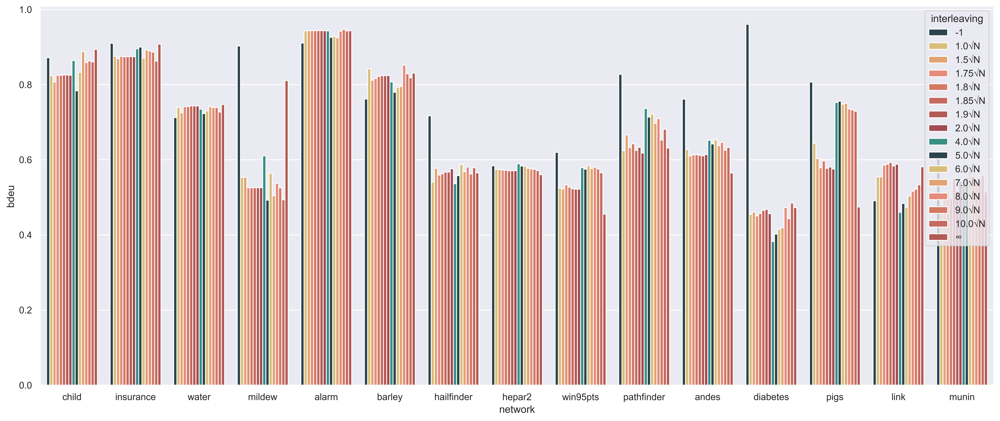

In [28]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES')]

# Normalize the values of df2 between the maximun and the minimun value for each network
df2['bdeu'] = df2.groupby('network')['bdeu'].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

g = sns.barplot(x="network", y="bdeu", hue="interleaving", data=df2, errorbar=None, palette=color3)

### SHD

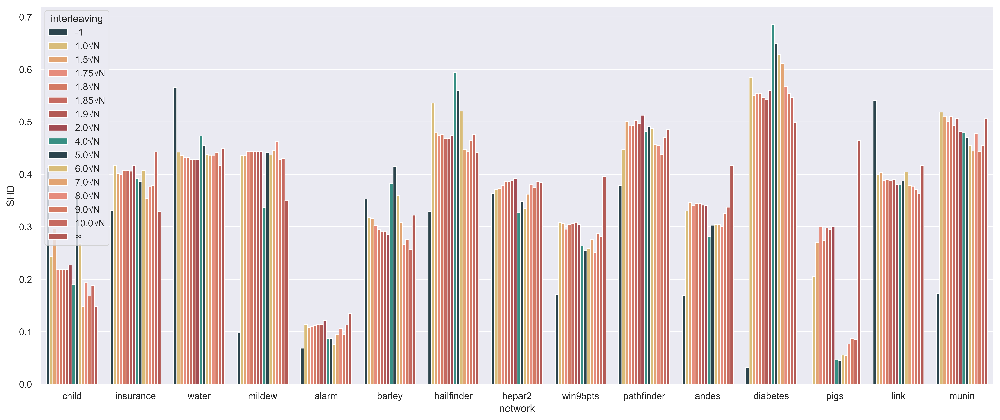

In [29]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES')]

# Normalize the values of df2 between the maximun and the minimun value for each network
df2['SHD'] = df2.groupby('network')['SHD'].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

g = sns.barplot(x="network", y="SHD", hue="interleaving", data=df2, errorbar=None, palette=color3)

### time(s)

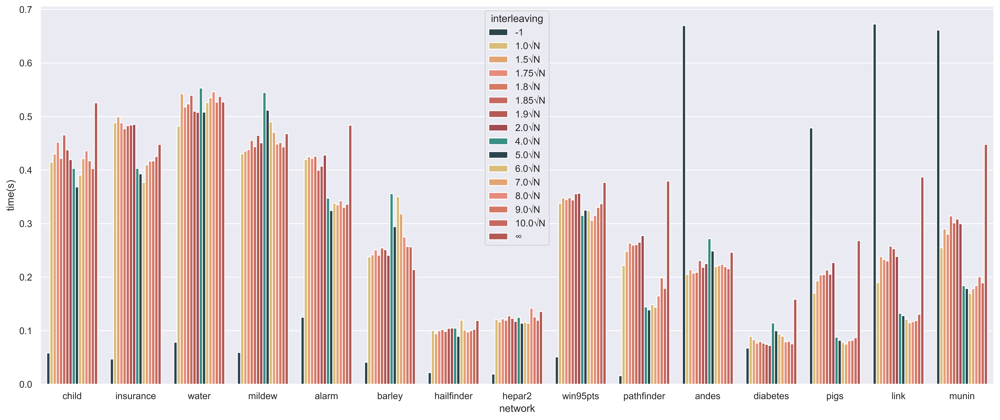

In [30]:
# For algorithm circular_ges_c2
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES')]

# Normalize the values of df2 between the maximun and the minimun value for each network
df2['time(s)'] = df2.groupby('network')['time(s)'].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

g = sns.barplot(x="network", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color3)

# Comparación interleaving sin normalizar

In [31]:
#df['interleaving'] = df_original['interleaving'].astype('category')
#df['interleaving'].cat.set_categories([-3, -2, -1, '1.0√N', '1.5√N', '1.75√N', '1.8√N', '1.85√N', '1.9√N', '2.0√N', '∞'], inplace=True)

### BDeu

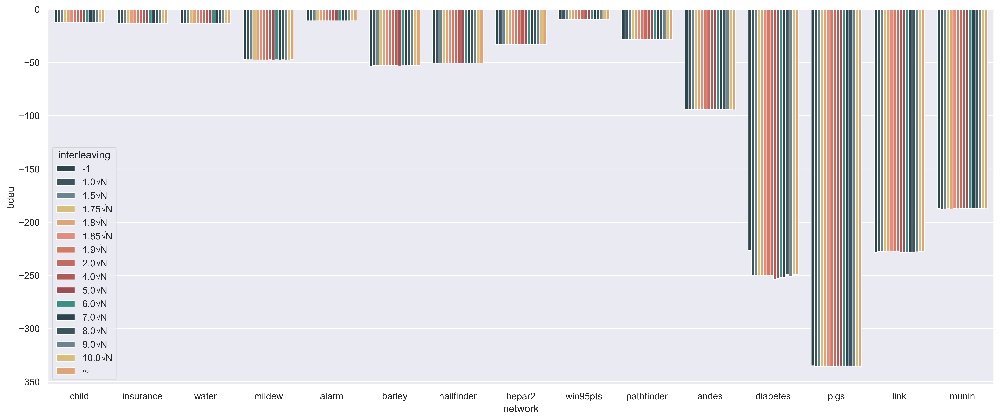

In [32]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

g = sns.barplot(x="network", y="bdeu", hue="interleaving", data=df2, errorbar=None, palette=color4)

### SHD

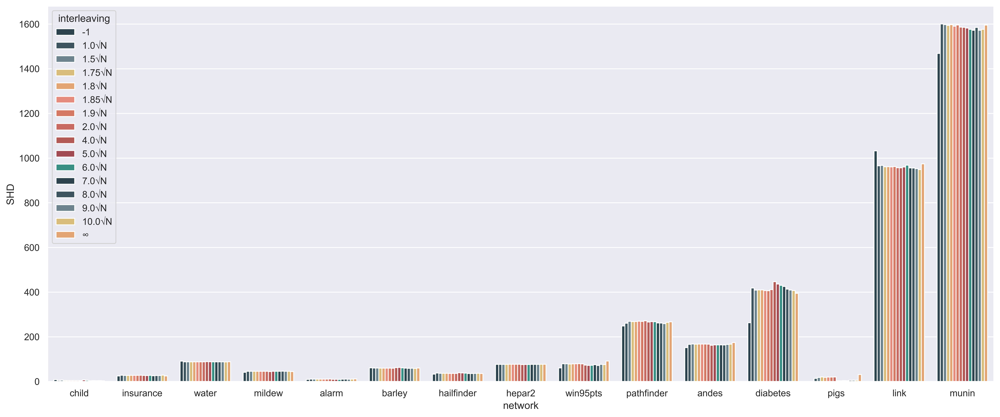

In [33]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

g = sns.barplot(x="network", y="SHD", hue="interleaving", data=df2, errorbar=None, palette=color4)

### time(s)

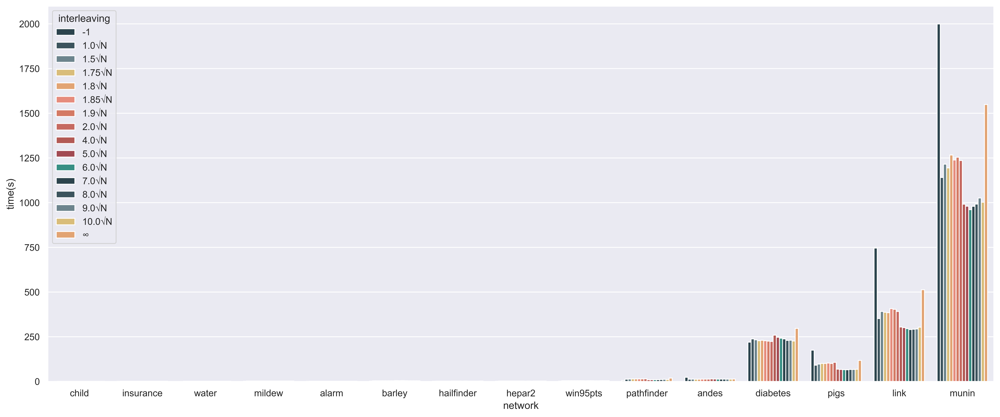

In [34]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES')]

g = sns.barplot(x="network", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color4)

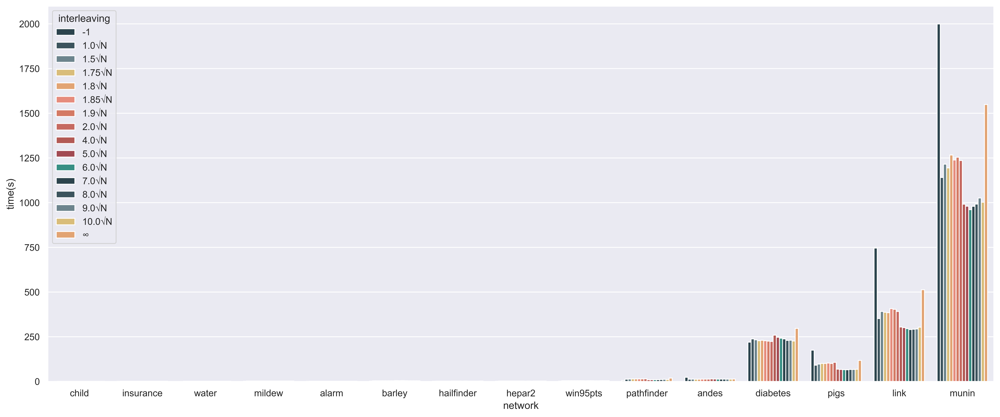

In [35]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

g = sns.barplot(x="network", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color4)

# BDeu por BBDD

In [36]:
df['interleaving'] = df_original['interleaving'].astype('category')
df['interleaving'].cat.set_categories([-3, -2, -1, '1.0√N', '2.0√N', '4.0√N', '5.0√N', '6.0√N', '7.0√N','8.0√N','9.0√N', '10.0√N', '∞'], inplace=True)

## Pigs

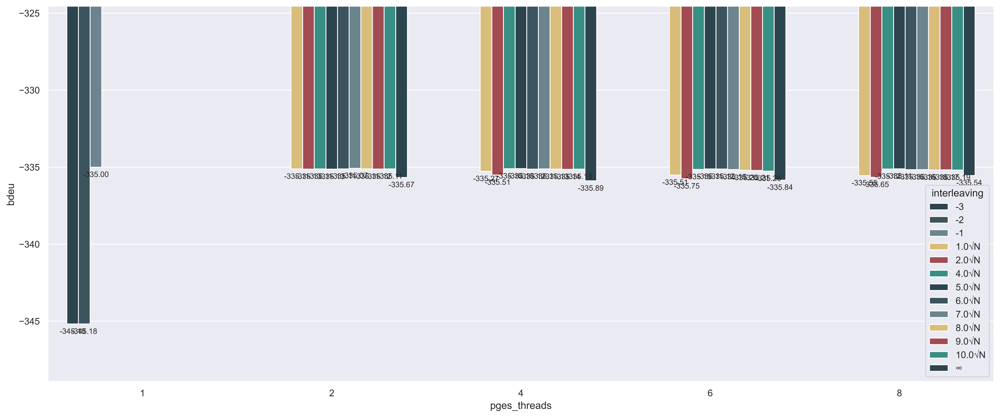

In [37]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'pigs'))]

g = sns.barplot(x="pges_threads", y="bdeu", hue="interleaving", data=df2, errorbar=None, palette=color6)

min = df2['bdeu'].min()*1.01
max = df2['bdeu'].max()*0.97
g.set_ylim(min, max)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()
        altura -= (max-min)*0.03

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.2f}').format(p.get_height()), ha='center', va='bottom', fontsize=9) 

## Link

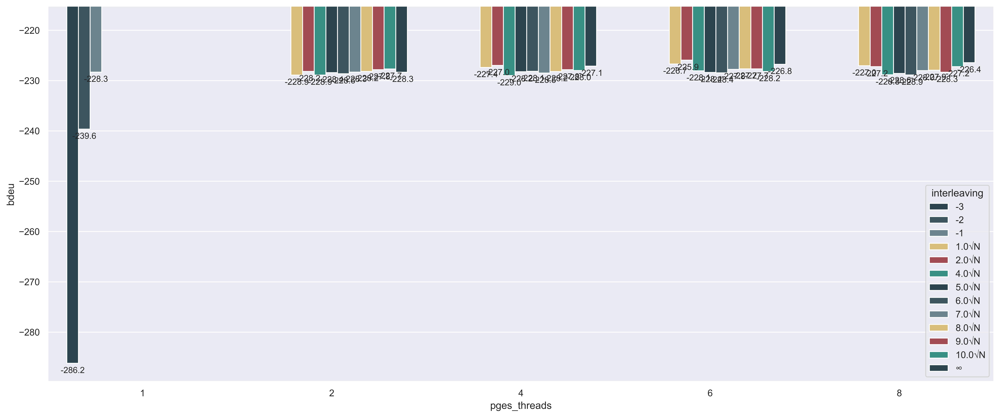

In [38]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'link'))]

g = sns.barplot(x="pges_threads", y="bdeu", hue="interleaving", data=df2, errorbar=None, palette=color6)

min = df2['bdeu'].min()*1.01
max = df2['bdeu'].max()*0.97
g.set_ylim(min, max)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()
        altura -= (max-min)*0.03

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=10) 

## Munin

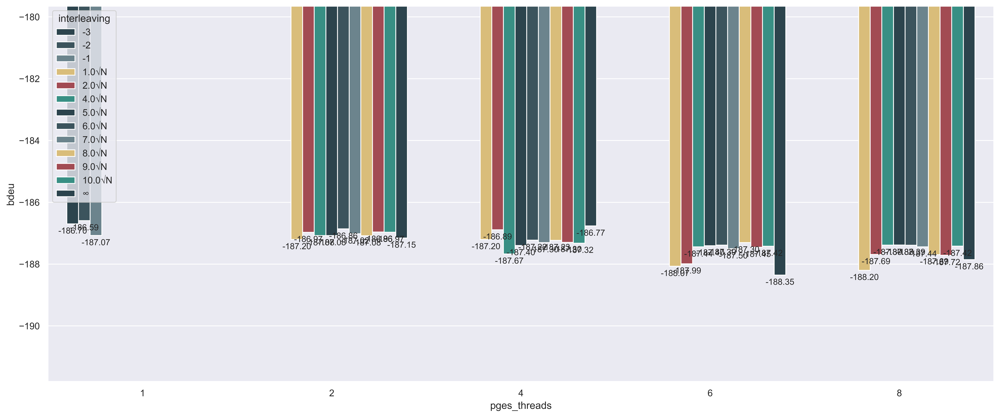

In [39]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'munin'))]

g = sns.barplot(x="pges_threads", y="bdeu", hue="interleaving", data=df2, errorbar=None, palette=color6)

min = df2['bdeu'].min()*1.01
max = df2['bdeu'].max()*0.97
g.set_ylim(min, max)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()
        altura -= (max-min)*0.03

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.2f}').format(p.get_height()), ha='center', va='bottom', fontsize=10) 

# SHD por BBDD

## Pigs

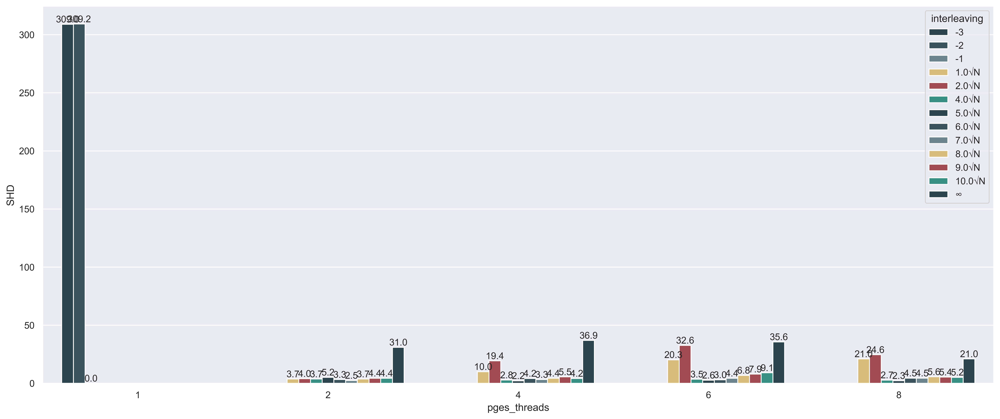

In [40]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'pigs'))]

g = sns.barplot(x="pges_threads", y="SHD", hue="interleaving", data=df2, errorbar=None, palette=color6)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

## Link

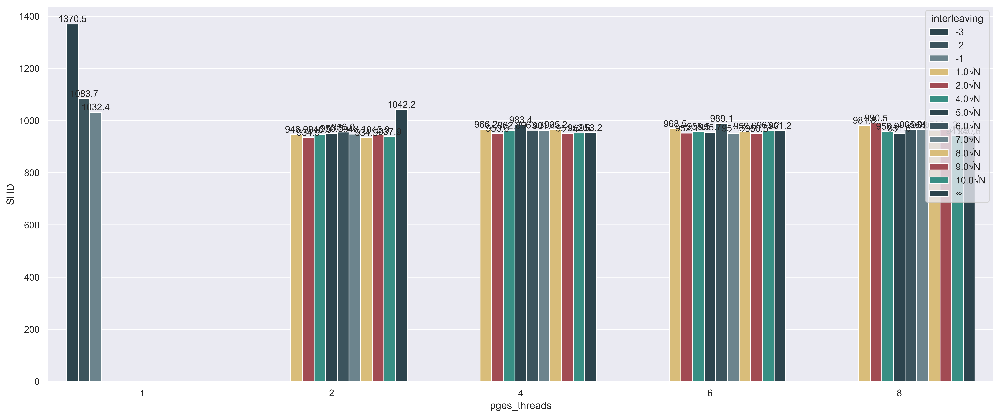

In [41]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'link'))]

g = sns.barplot(x="pges_threads", y="SHD", hue="interleaving", data=df2, errorbar=None, palette=color6)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

## Munin

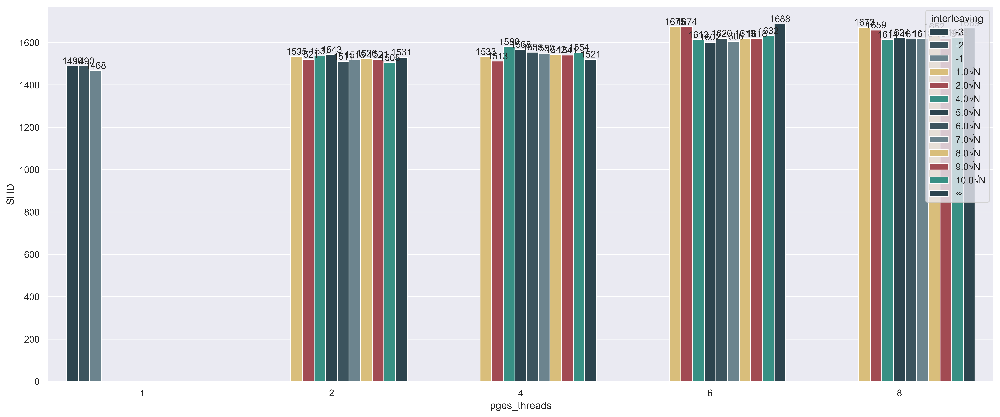

In [42]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'munin'))]

g = sns.barplot(x="pges_threads", y="SHD", hue="interleaving", data=df2, errorbar=None, palette=color6)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.0f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

# Tiempo por BBDD

## Pigs

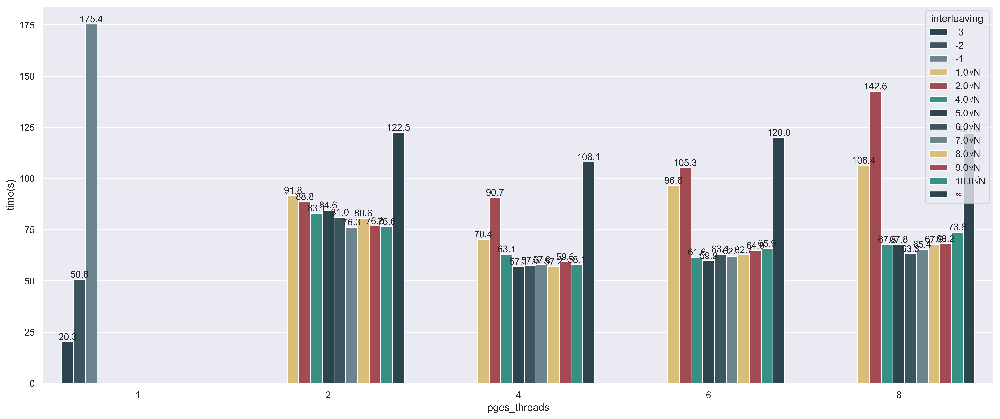

In [43]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

df2 = df2[((df2['network'] == 'pigs'))]

g = sns.barplot(x="pges_threads", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color6)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

## Link

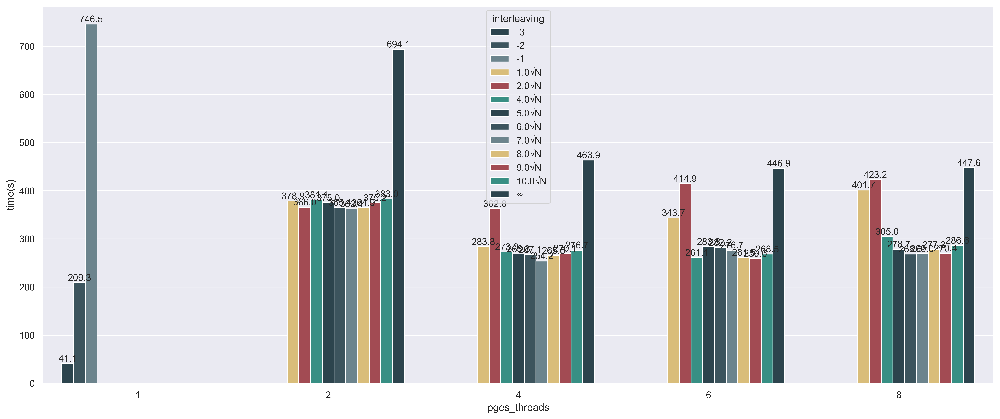

In [44]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES') | (df['algorithm'] == 'Fges') | (df['algorithm'] == 'Fges-faithfulness')]

# Mantain only pigs, link
df2 = df2[((df2['network'] == 'link'))]

g = sns.barplot(x="pges_threads", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color6)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

## Munin

In [45]:
# Order of bars: '1.0√N', '1.5√N', '1.75√N', '1.8√N', '1.85√N', '1.9√N', '2√N', '∞'
df['interleaving'] = df_original['interleaving'].astype('category')
df['interleaving'].cat.set_categories([-1, '1.0√N', '2.0√N', '4.0√N', '5.0√N', '6.0√N', '7.0√N','8.0√N','9.0√N', '10.0√N', '∞'], inplace=True)

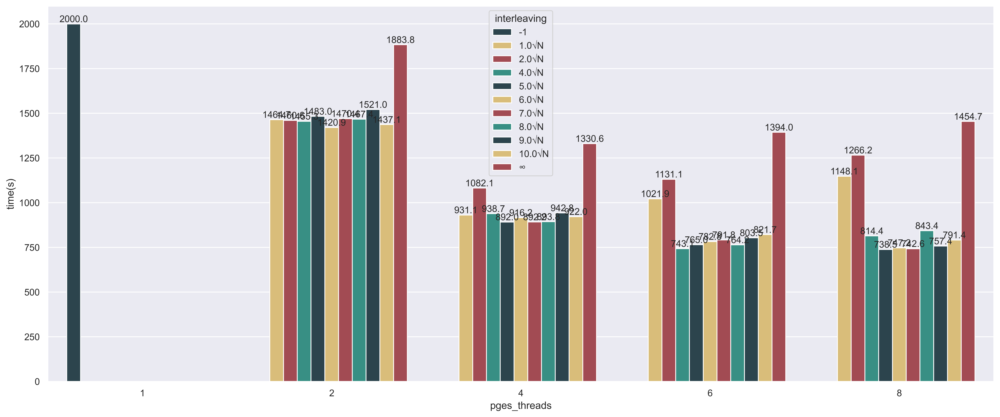

In [46]:
df2 = df[((df['algorithm'] == 'circular_ges_c2')) | (df['algorithm'] == 'GES')]

# Mantain only pigs, link
df2 = df2[((df2['network'] == 'munin'))]

g = sns.barplot(x="pges_threads", y="time(s)", hue="interleaving", data=df2, errorbar=None, palette=color5)

# Imprimir valores de las barras en la parte superior
for p in g.patches:
    if not np.isnan(p.get_height()):
        altura = p.get_height()

        # Imprimir valores de las barras en la parte inferior
        g.text(p.get_x() + p.get_width()/2., altura, ('{0:.1f}').format(p.get_height()), ha='center', va='bottom', fontsize=11) 

# Tables to LaTeX

In [47]:
# Orden de las redes (igual que en bnlearn)
orderNET = ['pigs', 'link', 'munin']

orderCOL = ['Fges', 'GES', 'cGES 2 ∞', 'cGES 4 ∞', 'cGES 8 ∞', 'cGES 2 10.0√N', 'cGES 4 10.0√N', 'cGES 8 10.0√N']

In [48]:
# Delete pges-faith and pGES
df = df[df['algorithm'].isin([
    'Fges',
    'GES',
    'circular_ges_c2'])]

# Only mantain networks pigs, link and munin
df = df[df['network'].isin([
    'pigs',
    'link',
    'munin'])]

In [49]:
# Rename circular_ges_c2  to cGES + pges_threads
df.loc[df['algorithm'] == 'circular_ges_c2', 'algorithm'] = 'cGES ' + df['pges_threads'].astype(str) + ' ' + df['interleaving'].astype(str)

# Drop algorithms including 2.0√N or nan in their name
df = df[~df['algorithm'].str.contains('2.0√N')]
df = df[~df['algorithm'].str.contains('nan')]

# Drop pges_threads==6 
df = df[df['pges_threads'] != 6]

In [50]:
# Order df by algorithm, network, bbdd, pges_threads
df = df.sort_values(by=["algorithm", "network", "bbdd", "pges_threads"])

In [51]:
df.algorithm.unique()

array(['Fges', 'GES', 'cGES 2 1.0√N', 'cGES 2 10.0√N', 'cGES 2 4.0√N',
       'cGES 2 5.0√N', 'cGES 2 6.0√N', 'cGES 2 7.0√N', 'cGES 2 8.0√N',
       'cGES 2 9.0√N', 'cGES 2 ∞', 'cGES 4 1.0√N', 'cGES 4 10.0√N',
       'cGES 4 4.0√N', 'cGES 4 5.0√N', 'cGES 4 6.0√N', 'cGES 4 7.0√N',
       'cGES 4 8.0√N', 'cGES 4 9.0√N', 'cGES 4 ∞', 'cGES 8 1.0√N',
       'cGES 8 10.0√N', 'cGES 8 4.0√N', 'cGES 8 5.0√N', 'cGES 8 6.0√N',
       'cGES 8 7.0√N', 'cGES 8 8.0√N', 'cGES 8 9.0√N', 'cGES 8 ∞'],
      dtype=object)

# exreport

In [52]:
df2 = df[df['algorithm'].isin([
    'Fges', 
    'GES',
    'cGES 2 10.0√N',
    'cGES 4 10.0√N',
    'cGES 8 10.0√N',
    'cGES 2 ∞',
    'cGES 4 ∞',
    'cGES 8 ∞'])]

# Rename time(s) to time
df2 = df2.rename(columns={'time(s)': 'time'})

df2 = df2.drop(["threads","seed","interleaving","iterations"], axis=1)

# Delete pges_threads = 0
df2 = df2[df2["pges_threads"] != 0]

# Mean of all the bbdd
df2 = df2.groupby(["bbdd", "algorithm", "pges_threads"], observed=True).mean().reset_index()

# Delete the character / from the header
df2.columns = df2.columns.str.replace('/', '')

# Redondear a 4 decimales
df2 = df2.round(4)

# Write csv 
df2.to_csv('./exreport/exreport.csv', index=False)

# Delete folder exreport_output and its content if exists
if os.path.exists('./exreport/exreport_output'):
    shutil.rmtree('./exreport/exreport_output')

# Execute exreport.r
os.system('Rscript ./exreport/exreport-sinDelta.r')

'data.frame':	257 obs. of  11 variables:
 $ bbdd        : chr  "link.xbif50001246_" "link.xbif50001246_" "link.xbif50001246_" "link.xbif50001246_" ...
 $ algorithm   : chr  "Fges" "GES" "cGES 2 10.0√N" "cGES 2 ∞" ...
 $ pges_threads: int  1 1 2 2 4 4 8 8 1 1 ...
 $ SHD         : num  1374 1011 891 965 918 ...
 $ loglike     : num  -0.386 -0.499 -0.482 -0.456 -0.48 ...
 $ bdeu        : num  -286 -226 -225 -225 -226 ...
 $ deltaMM     : num  2828 2058 1812 2206 1950 ...
 $ deltaMM.    : num  860 796 584 1086 742 ...
 $ deltaMM..1  : num  1968 1262 1228 1120 1208 ...
 $ time        : num  40.1 724.4 417.1 843.7 273.6 ...
 $ nodes       : num  724 724 724 724 724 724 724 724 724 724 ...
1 ) Experiment pGES loaded from a data set.

#Experiment name: pGES

#algorithm: cGES 2 ∞, cGES 2 10.0√N, cGES 4 ∞, cGES 4 10.0√N, cGES 8 ∞, cGES 8 10.0√N, Fges, GES

#bbdd: link.xbif_, link.xbif50001_, link.xbif50001246_, link.xbif50002_, link.xbif50003_, link.xbif50004_, link.xbif50005_, link.xbif50006_, 

Warning message:
The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the exreport package.
  Please report the issue to the authors. 
There were 50 or more warnings (use warnings() to see the first 50)


[1] "Distribution of ranks for output \"bdeu\""
---------------------------------------------------------------------
Friedman test, objetive minimize output variable SHD. Obtained p-value: 1.9543e-08
Chi squared with 7 degrees of freedom statistic: 49.3308
Test rejected: p-value: 1.9543e-08 < 0.0500
---------------------------------------------------------------------
Control post hoc test for output SHD
Adjust method: Holm

Control method: cGES 2 10.0√N
p-values:
            GES	0.9800
cGES 4 10.0√N	0.6059
cGES 8 10.0√N	0.0811
     cGES 4 ∞	0.0067
     cGES 2 ∞	0.0020
     cGES 8 ∞	0.0009
           Fges	0.0000
---------------------------------------------------------------------
$testMultiple
                  algorithm       pvalue     rank win tie loss
cGES 2 10.0√N cGES 2 10.0√N           NA 3.075758  NA  NA   NA
GES                     GES 9.799545e-01 3.090909  13   3   17
cGES 4 10.0√N cGES 4 10.0√N 6.058663e-01 3.696970  19   2   12
cGES 8 10.0√N cGES 8 10.0√N 8.109023e-02 4.

There were 50 or more warnings (use warnings() to see the first 50)
There were 50 or more warnings (use warnings() to see the first 50)


[1] "Distribution of ranks for output \"time\""


There were 50 or more warnings (use warnings() to see the first 50)


0

## BDeu

In [53]:
df = df.drop(["nodes"], axis=1)

In [54]:
df_unstack = df.drop(["threads", "bbdd", "interleaving", "seed", "SHD", "loglike", "time(s)", "deltaMM", "deltaMM+", "deltaMM-", "iterations", "SHD"], axis=1)

df_unstack = df_unstack.drop(["pges_threads"], axis=1)

bdeu_table = df_unstack.groupby(["network", "algorithm"], observed=True).mean().unstack(0)

bdeu_table = bdeu_table.transpose()

# Changue index to network
bdeu_table.index = bdeu_table.index.droplevel(0)
 
# Order by network
bdeu_table = bdeu_table.reindex(orderNET)

# Order of the columns: Fges, Fges-faith, GES, pGES, pGES-jc
bdeu_table = bdeu_table.reindex(columns=orderCOL)

# Capitalize the first letter of the network
bdeu_table.index = bdeu_table.index.str.capitalize()

# Fill network between /textsc{ and }
bdeu_table.index = bdeu_table.index.str.replace(r'(\w+)', r'\\textsc{\1}')

table = bdeu_table.to_latex(float_format="%.4f", escape=False, na_rep="")

print(table)

\begin{tabular}{lrrrrrrrr}
\toprule
algorithm &      Fges &       GES &  cGES 2 ∞ &  cGES 4 ∞ &  cGES 8 ∞ &  cGES 2 10.0√N &  cGES 4 10.0√N &  cGES 8 10.0√N \\
network        &           &           &           &           &           &                &                &                \\
\midrule
\textsc{Pigs}  & -345.1826 & -334.9989 & -335.6668 & -335.8876 & -335.5411 &      -335.1105 &      -335.1276 &      -335.1865 \\
\textsc{Link}  & -286.1877 & -228.3056 & -228.3288 & -227.1207 & -226.4319 &      -227.6806 &      -227.9895 &      -227.2155 \\
\textsc{Munin} & -186.6973 & -187.0736 & -187.1536 & -186.7651 & -187.8554 &      -186.9679 &      -187.3224 &      -187.4198 \\
\bottomrule
\end{tabular}



In [55]:
bdeu_table

algorithm,Fges,GES,cGES 2 ∞,cGES 4 ∞,cGES 8 ∞,cGES 2 10.0√N,cGES 4 10.0√N,cGES 8 10.0√N
network,,,,,,,,
\textsc{Pigs},-345.182620,-334.998948,-335.666789,-335.887591,-335.541086,-335.110500,-335.127621,-335.186549
\textsc{Link},-286.187711,-228.305646,-228.328804,-227.120662,-226.431892,-227.680577,-227.989548,-227.215485
\textsc{Munin},-186.697338,-187.073569,-187.153624,-186.765103,-187.855381,-186.967899,-187.322440,-187.419793


## SHD

In [56]:
df_unstack = df.drop(["threads", "bbdd", "interleaving", "seed", "bdeu", "loglike", "time(s)", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)

df_unstack = df_unstack.drop(["pges_threads"], axis=1)

bdeu_table = df_unstack.groupby(["network", "algorithm"], observed=True).mean().unstack(0)

bdeu_table = bdeu_table.transpose()

# Changue index to network
bdeu_table.index = bdeu_table.index.droplevel(0)
 
# Order by network
bdeu_table = bdeu_table.reindex(orderNET)

# Order of the columns: Fges, Fges-faith, GES, pGES, pGES-jc
bdeu_table = bdeu_table.reindex(columns=orderCOL)

# Capitalize the first letter of the network
bdeu_table.index = bdeu_table.index.str.capitalize()

# Fill network between /textsc{ and }
bdeu_table.index = bdeu_table.index.str.replace(r'(\w+)', r'\\textsc{\1}')

table = bdeu_table.to_latex(float_format="%.2f", escape=False, na_rep="")

print(table)

\begin{tabular}{lrrrrrrrr}
\toprule
algorithm &    Fges &     GES &  cGES 2 ∞ &  cGES 4 ∞ &  cGES 8 ∞ &  cGES 2 10.0√N &  cGES 4 10.0√N &  cGES 8 10.0√N \\
network        &         &         &           &           &           &                &                &                \\
\midrule
\textsc{Pigs}  &  309.00 &    0.00 &     31.00 &     36.91 &     21.00 &           4.36 &           4.18 &           5.18 \\
\textsc{Link}  & 1370.45 & 1032.36 &   1042.18 &    953.18 &    940.64 &         937.91 &         952.64 &         941.55 \\
\textsc{Munin} & 1489.64 & 1468.45 &   1531.18 &   1521.38 &   1668.89 &        1505.00 &        1554.00 &        1623.22 \\
\bottomrule
\end{tabular}



In [57]:
bdeu_table

algorithm,Fges,GES,cGES 2 ∞,cGES 4 ∞,cGES 8 ∞,cGES 2 10.0√N,cGES 4 10.0√N,cGES 8 10.0√N
network,,,,,,,,
\textsc{Pigs},309.000000,0.000000,31.000000,36.909091,21.000000,4.363636,4.181818,5.181818
\textsc{Link},1370.454545,1032.363636,1042.181818,953.181818,940.636364,937.909091,952.636364,941.545455
\textsc{Munin},1489.636364,1468.454545,1531.181818,1521.375000,1668.888889,1505.000000,1554.000000,1623.222222


## time(s)

In [58]:
df_unstack = df.drop(["threads", "bbdd", "interleaving", "seed", "bdeu", "loglike", "SHD", "deltaMM", "deltaMM+", "deltaMM-", "iterations"], axis=1)

df_unstack = df_unstack.drop(["pges_threads"], axis=1)

bdeu_table = df_unstack.groupby(["network", "algorithm"], observed=True).mean().unstack(0)

bdeu_table = bdeu_table.transpose()

# Changue index to network
bdeu_table.index = bdeu_table.index.droplevel(0)
 
# Order by network
bdeu_table = bdeu_table.reindex(orderNET)

# Order of the columns: Fges, Fges-faith, GES, pGES, pGES-jc
bdeu_table = bdeu_table.reindex(columns=orderCOL)

# Capitalize the first letter of the network
bdeu_table.index = bdeu_table.index.str.capitalize()

# Fill network between /textsc{ and }
bdeu_table.index = bdeu_table.index.str.replace(r'(\w+)', r'\\textsc{\1}')

table = bdeu_table.to_latex(float_format="%.2f", escape=False, na_rep="")

print(table)

\begin{tabular}{lrrrrrrrr}
\toprule
algorithm &     Fges &     GES &  cGES 2 ∞ &  cGES 4 ∞ &  cGES 8 ∞ &  cGES 2 10.0√N &  cGES 4 10.0√N &  cGES 8 10.0√N \\
network        &          &         &           &           &           &                &                &                \\
\midrule
\textsc{Pigs}  &    20.26 &  175.43 &    122.47 &    108.08 &    121.80 &          76.59 &          58.06 &          73.84 \\
\textsc{Link}  &    41.12 &  746.54 &    694.08 &    463.92 &    447.62 &         383.04 &         276.72 &         286.56 \\
\textsc{Munin} & 12331.31 & 2000.00 &   1883.78 &   1330.62 &   1454.72 &        1437.10 &         922.02 &         791.36 \\
\bottomrule
\end{tabular}



In [59]:
bdeu_table

algorithm,Fges,GES,cGES 2 ∞,cGES 4 ∞,cGES 8 ∞,cGES 2 10.0√N,cGES 4 10.0√N,cGES 8 10.0√N
network,,,,,,,,
\textsc{Pigs},20.262455,175.428273,122.467727,108.083182,121.795455,76.587273,58.063000,73.843091
\textsc{Link},41.115909,746.542273,694.084727,463.916182,447.624273,383.038273,276.718091,286.555364
\textsc{Munin},12331.305636,1999.998455,1883.776636,1330.618250,1454.724778,1437.095182,922.020636,791.357111


In [60]:
# Divide each column by GES column
bdeu_table = bdeu_table.div(bdeu_table["GES"], axis=0)
bdeu_table

algorithm,Fges,GES,cGES 2 ∞,cGES 4 ∞,cGES 8 ∞,cGES 2 10.0√N,cGES 4 10.0√N,cGES 8 10.0√N
network,,,,,,,,
\textsc{Pigs},0.115503,1.0,0.698107,0.61611,0.694275,0.436573,0.330979,0.420930
\textsc{Link},0.055075,1.0,0.929733,0.62142,0.599597,0.513083,0.370666,0.383843
\textsc{Munin},6.165658,1.0,0.941889,0.66531,0.727363,0.718548,0.461011,0.395679


In [61]:
# mean
bdeu_table.mean()

algorithm
Fges             2.112078
GES              1.000000
cGES 2 ∞         0.856576
cGES 4 ∞         0.634280
cGES 8 ∞         0.673745
cGES 2 10.0√N    0.556068
cGES 4 10.0√N    0.387552
cGES 8 10.0√N    0.400151
dtype: float64